In [1]:
import scanpy as sc
import os
import numpy as np
import seaborn
import matplotlib
import pandas as pd
import sys
import scipy
import tqdm
import matplotlib.pyplot as plt

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis
# sys.path.append('/home/matthew.schmitz/Matthew/code/scANTIPODE/')
import antipode
import antipode.antipode_model
import antipode.model_functions
import antipode.model_distributions
import antipode.model_modules
import antipode.train_utils
import antipode.plotting
sc.settings.figdir=os.path.expanduser('~/WbFigures/DevAnalysis')


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
MDE_KEY='X_antipode_UMAP'
leaf_key = 'level_2'
discov_key = 'species'
layer_key = 'spliced'
model_tag = '1.9.1.8.5_Dev_final_noQ_INP_moredim_regionsample'


In [3]:
adata=sc.read_h5ad('/home/matthew.schmitz/Matthew/models/'+model_tag+'/p4_adata.h5ad',backed='r')

In [4]:
adata.obs.index=adata.obs.index.to_series().str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)

In [5]:
curateds=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/annotations/curated_class.txt',index_col=0)
curateds=curateds.rename({leaf_key:'anno_level_2'},axis=1)
#adata.obs.loc[:,curateds.columns]=adata.obs.loc[:,curateds.columns].astype('string')
adata.obs.loc[:,curateds.columns]=curateds.astype('string')
adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_dict()['female'])

/scratch/fast/207760/ipykernel_4134648/2824853591.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_dict()['female'])
/scratch/fast/207760/ipykernel_4134648/2824853591.py:5: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['female']=adata.obs['batch_name'].replace(pd.read_csv('/home/matthew.schmitz/Matthew/data/taxtest/extra/inferred_sex.csv',index_col=0).to_dict()['female'])


# LaManno Labels

In [6]:
linnarson_labels=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/extra/mousefastqpool/SRP135960_linnarson_adultmouse/annotations/unambiguous_metadata_renamed.csv',index_col=0)

In [7]:
linnarson_labels.index = list(linnarson_labels.index.to_series().str.replace('-[0-9]+$','',regex=True))

In [8]:
linnarson_labels=linnarson_labels.loc[linnarson_labels.index.isin(adata.obs.index),:]

In [9]:
linnarson_labels

,n_genes,batch_name,dataset_name,timepoint,region,clean_cellname,full_cellname,msregion,general_region,species,...,Split,Strain,Subclass,Target_Num_Cells,Tissue,TotalUMI,Transcriptome,cDNA_Lib_Ok,ngperul_cDNA,barcode
GATCCCTGTTGGTG_e10.0_Forebrain_SRR11947585,5583,e10.0_Forebrain_SRR11947585,PRJNA637987_lamanno_devmouse,10,FB,GATCCCTGTTGGTG,GATCCCTGTTGGTG_e10.0_Forebrain_SRR11947585,NaN,h,mouse,...,0,CD-1,Forebrain,3500.0,Forebrain,37523.0,mm10,Y,"10,0",GATCCCTGTTGGTG
TGCAATCTTCCGAA_e10.0_Forebrain_SRR11947585,3597,e10.0_Forebrain_SRR11947585,PRJNA637987_lamanno_devmouse,10,FB,TGCAATCTTCCGAA,TGCAATCTTCCGAA_e10.0_Forebrain_SRR11947585,NaN,h,mouse,...,0,CD-1,Erythroid progenitor,3500.0,Forebrain,36939.0,mm10,Y,"10,0",TGCAATCTTCCGAA
GACGTAACGATAAG_e10.0_Forebrain_SRR11947585,5416,e10.0_Forebrain_SRR11947585,PRJNA637987_lamanno_devmouse,10,FB,GACGTAACGATAAG,GACGTAACGATAAG_e10.0_Forebrain_SRR11947585,NaN,h,mouse,...,0,CD-1,Forebrain,3500.0,Forebrain,34992.0,mm10,Y,"10,0",GACGTAACGATAAG
ACATCACTACGCAT_e10.0_Forebrain_SRR11947585,3754,e10.0_Forebrain_SRR11947585,PRJNA637987_lamanno_devmouse,10,FB,ACATCACTACGCAT,ACATCACTACGCAT_e10.0_Forebrain_SRR11947585,NaN,h,mouse,...,0,CD-1,Erythroid progenitor,3500.0,Forebrain,36677.0,mm10,Y,"10,0",ACATCACTACGCAT
ATAAGTTGAACGAA_e10.0_Forebrain_SRR11947585,2921,e10.0_Forebrain_SRR11947585,PRJNA637987_lamanno_devmouse,10,FB,ATAAGTTGAACGAA,ATAAGTTGAACGAA_e10.0_Forebrain_SRR11947585,NaN,h,mouse,...,0,CD-1,Erythroid progenitor,3500.0,Forebrain,36413.0,mm10,Y,"10,0",ATAAGTTGAACGAA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCACTTGTGGGAG_e18.0_ForebrainVentroLateral_SRR11947657,856,e18.0_ForebrainVentroLateral_SRR11947657,PRJNA637987_lamanno_devmouse,18,FB,ATCACTTGTGGGAG,ATCACTTGTGGGAG_e18.0_ForebrainVentroLateral_SR...,NaN,h,mouse,...,1,CD-1,Mixed region glutamatergic,3500.0,Midbrain,8062.0,mm10,Y,"4,0",ATCACTTGTGGGAG
ATTCGGGAACGGTT_e18.0_ForebrainVentroLateral_SRR11947657,804,e18.0_ForebrainVentroLateral_SRR11947657,PRJNA637987_lamanno_devmouse,18,FB,ATTCGGGAACGGTT,ATTCGGGAACGGTT_e18.0_ForebrainVentroLateral_SR...,NaN,h,mouse,...,0,CD-1,Oligodendrocyte precursor cell,3500.0,ForebrainVentroLateral,3272.0,mm10,Y,"4,8",ATTCGGGAACGGTT
ATGCAGACGGATTC_e18.0_ForebrainVentroLateral_SRR11947657,924,e18.0_ForebrainVentroLateral_SRR11947657,PRJNA637987_lamanno_devmouse,18,FB,ATGCAGACGGATTC,ATGCAGACGGATTC_e18.0_ForebrainVentroLateral_SR...,NaN,h,mouse,...,1,CD-1,Mixed region and neurotransmitter,3500.0,Midbrain,11987.0,mm10,Y,"4,0",ATGCAGACGGATTC
AATGAGGATGTCGA_e18.0_ForebrainVentroLateral_SRR11947657,902,e18.0_ForebrainVentroLateral_SRR11947657,PRJNA637987_lamanno_devmouse,18,FB,AATGAGGATGTCGA,AATGAGGATGTCGA_e18.0_ForebrainVentroLateral_SR...,NaN,h,mouse,...,1,CD-1,Mixed region glutamatergic,3500.0,Midbrain,6903.0,mm10,Y,"7,0",AATGAGGATGTCGA


In [10]:
cols=dict(zip(["Class","Subclass","ClusterName"],["lamanno_class","lamanno_subclass","lamanno_cluster"]))#linnarson_labels.columns[~linnarson_labels.columns.isin(adata.obs.columns)]
adata.obs.loc[linnarson_labels.index,cols.keys()]=linnarson_labels.loc[:,cols.keys()]
adata.obs.rename(columns=cols,inplace=True)

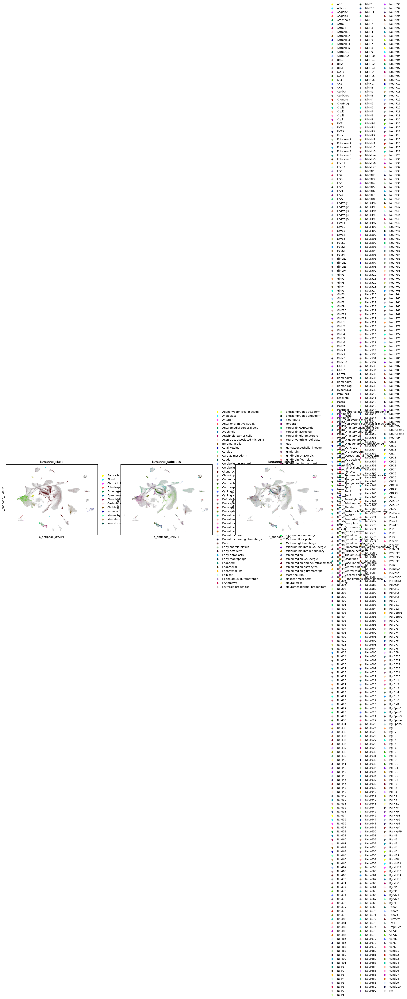

In [11]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["lamanno_class","lamanno_subclass","lamanno_cluster"],
    palette=sc.pl.palettes.godsnot_102
)


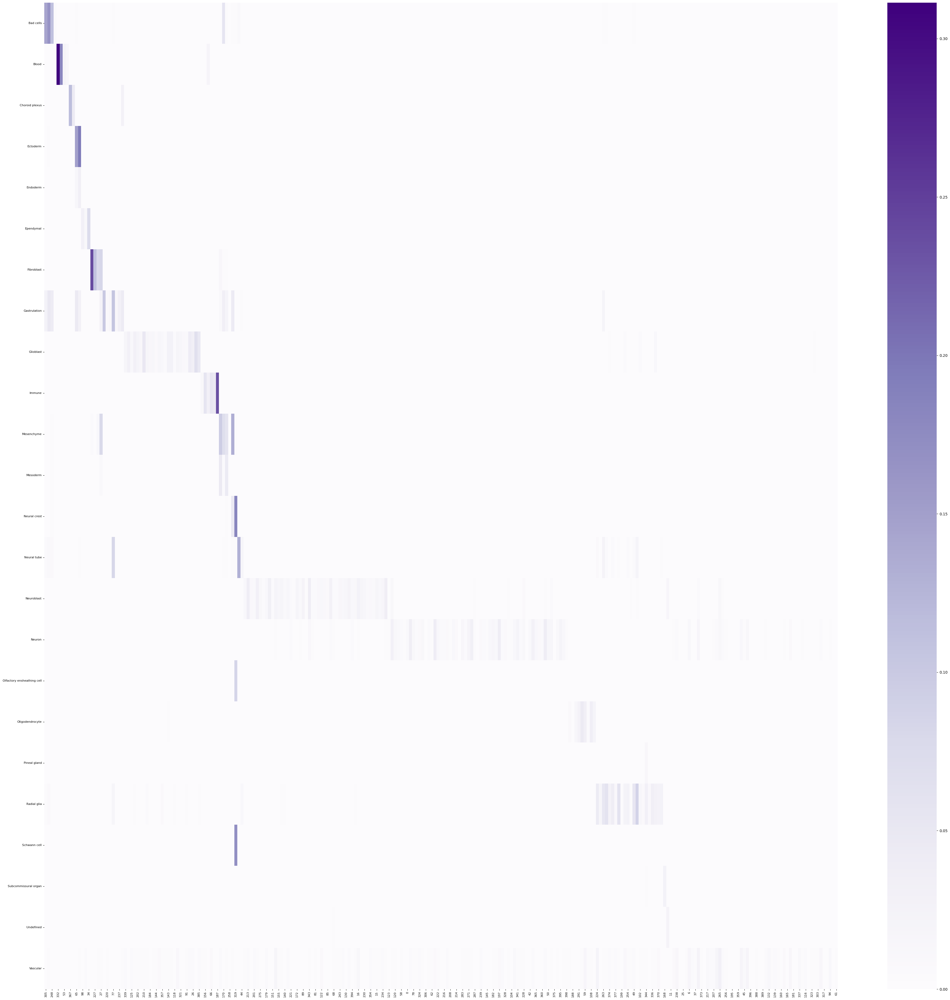

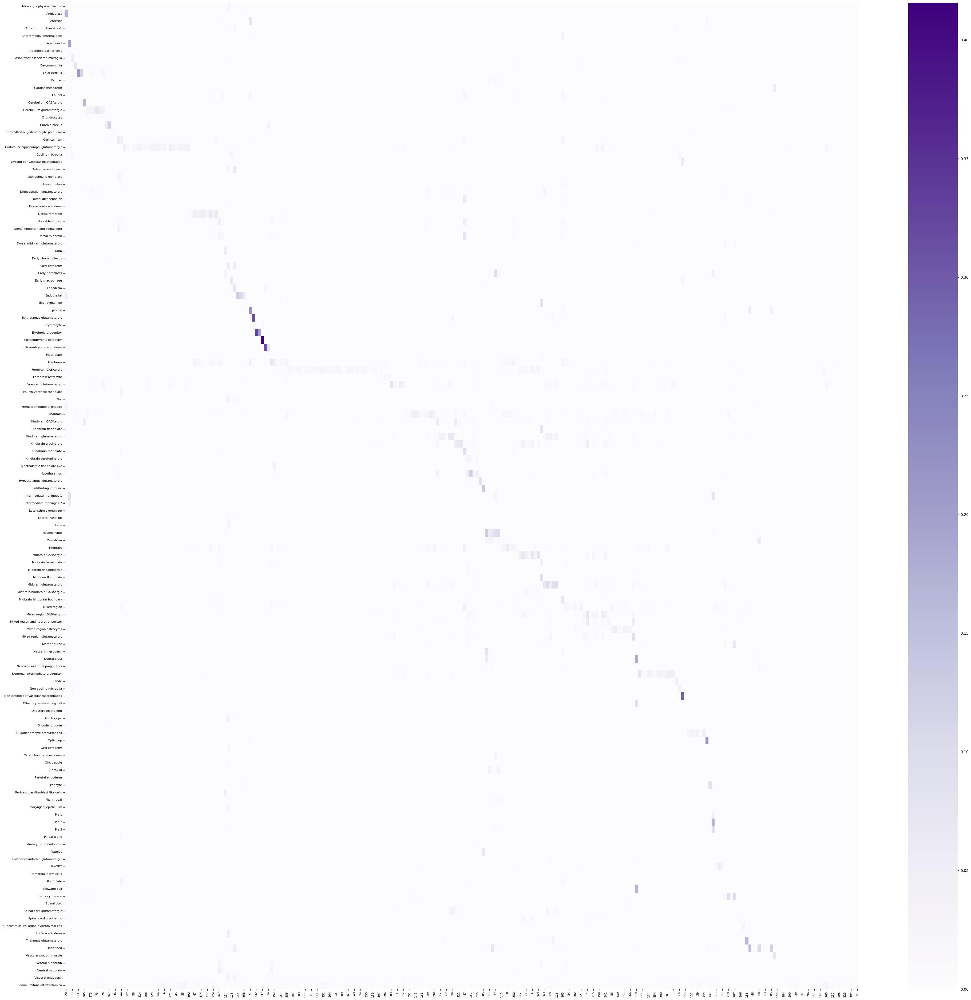

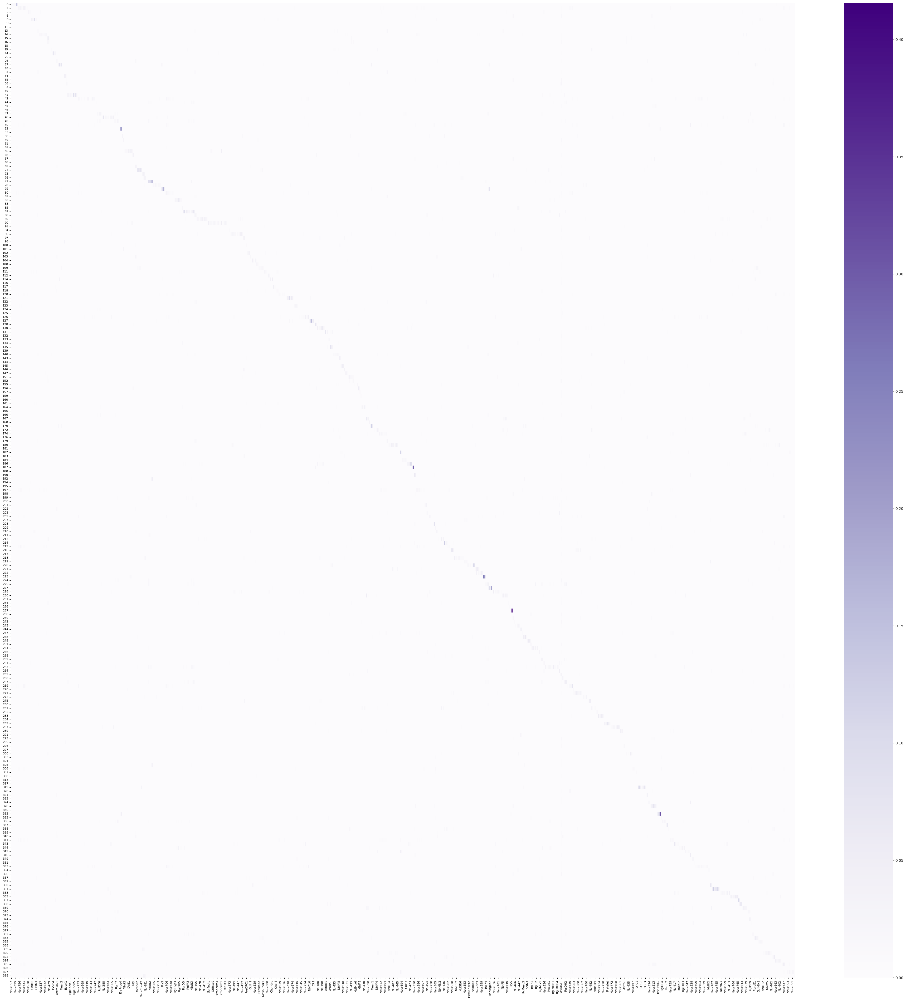

In [12]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'lamanno_class',leaf_key),cmap='Purples')
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'lamanno_subclass',leaf_key),cmap='Purples')
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,leaf_key,'lamanno_cluster'),cmap='Purples')

In [13]:
xcj=sc_analysis.get_cross_category_jaccard(adata.obs,'lamanno_subclass',leaf_key)

In [14]:
adata.obs['linnarson_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['lamanno_subclass'].value_counts().unstack().idxmax(1).to_dict())

/scratch/fast/207760/ipykernel_4134648/2888605536.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs['linnarson_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['lamanno_subclass'].value_counts().unstack().idxmax(1).to_dict())
/scratch/fast/207760/ipykernel_4134648/2888605536.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['linnarson_extended']=adata.obs[leaf_key].replace(adata.obs.groupby(leaf_key)['lamanno_subclass'].value_counts().unstack().idxmax(1).to_dict())


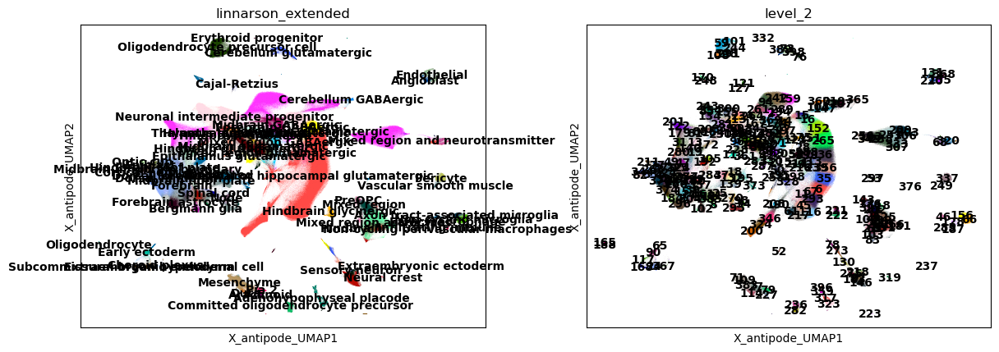

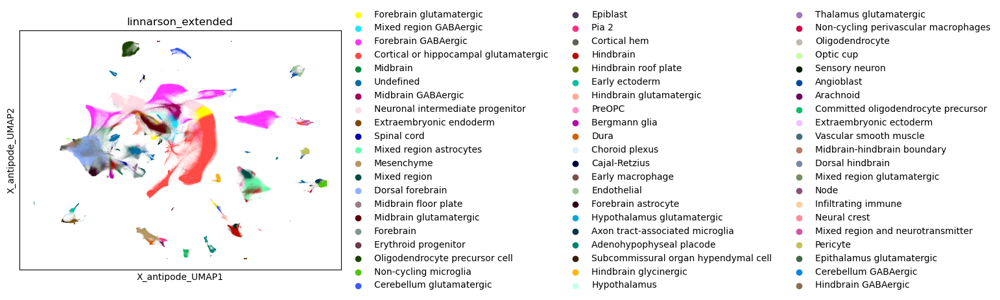

In [15]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended",leaf_key],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended"],
    palette=sc.pl.palettes.godsnot_102
)


In [16]:
in_obs=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/annotations/GSE169122_obs.csv.gz',index_col=0)
inds=adata.obs.index.str.replace(r'-\d+$', '', regex=True).str.replace(r'-\d+$', '', regex=True)
get_inds=inds[inds.isin(in_obs.index)]
adata.obs.loc[adata.obs.index[inds.isin(in_obs.index)],'initial_class']=list(in_obs.loc[adata.obs.index[inds.isin(in_obs.index)].str.replace(r'-\d+$', '', regex=True).str.replace(r'-\d+$', '', regex=True),'class'])
counts=adata.obs.groupby(leaf_key)['initial_class'].value_counts().unstack()
# couts = counts.drop('nan',axis=1)
counts=((10+counts.T)/((10+counts).T.sum(0))).T
counts['nan']=0.2
counts.index = counts.index.astype('str')
adata.obs['ic_extended']=adata.obs[leaf_key].replace(counts.idxmax(1).to_dict())

/scratch/fast/207760/ipykernel_4134648/1842140421.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts=adata.obs.groupby(leaf_key)['initial_class'].value_counts().unstack()
/scratch/fast/207760/ipykernel_4134648/1842140421.py:10: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['ic_extended']=adata.obs[leaf_key].replace(counts.idxmax(1).to_dict())


In [17]:
adata.obs['ic_extended'].value_counts()

ic_extended
nan                1765163
MGE_LHX6/MAF         72091
CGE_NR2F2/PROX1      44568
LGE_FOXP1/PENK       10217
Transition            5999
MGE_LHX6/NPY          4549
LGE_FOXP1/ISL1        4525
MGE_CRABP1/TAC3       3655
MGE_CRABP1/MAF        3171
Name: count, dtype: int64

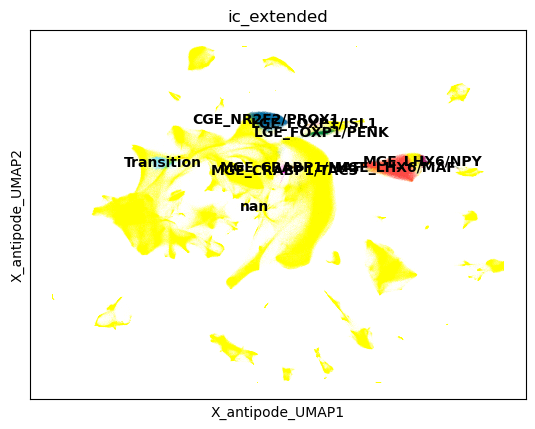

In [18]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['ic_extended'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

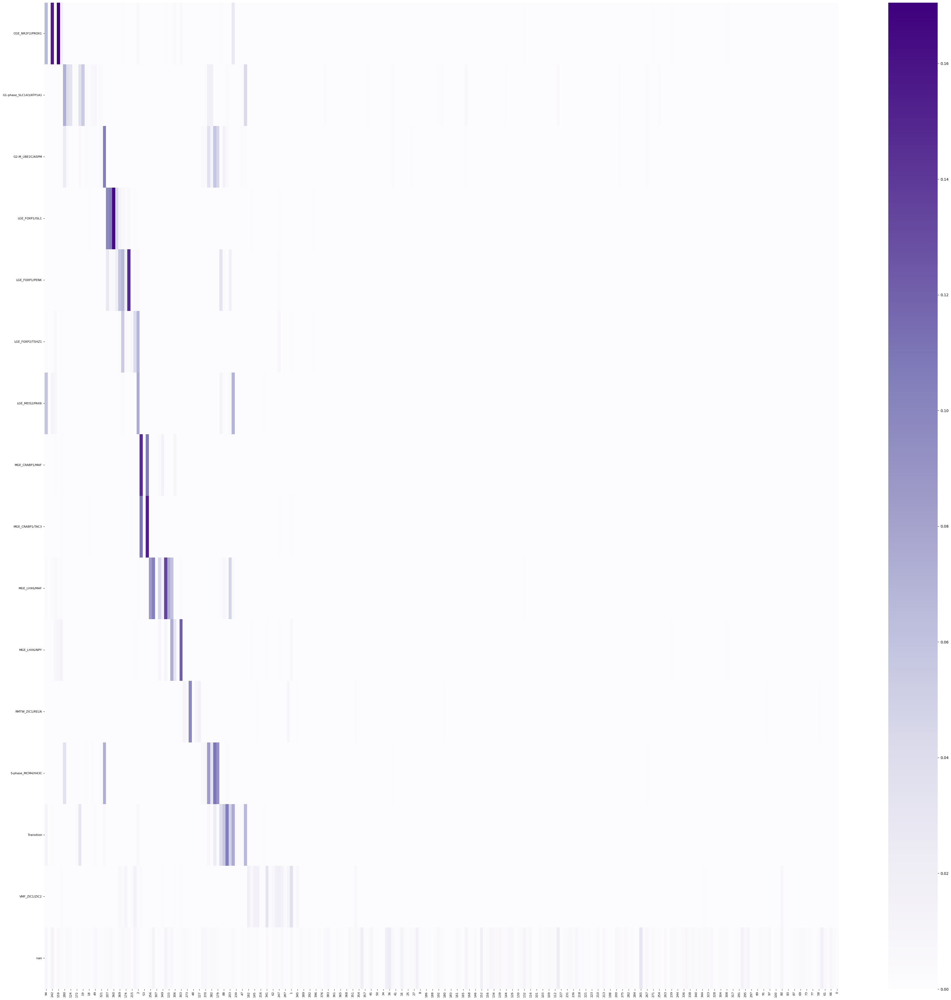

In [19]:
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'initial_class',leaf_key),cmap='Purples')

# Failure of MapMyCells

In [20]:
import json

# Path to your JSON file
file_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets_ABC_MAPPING/hann_results.json'

# Open the file and load its content
with open(file_path, 'r') as file:
    data = json.load(file)

rows = []
for item in data['results']:
    row = {
        'cell_id': item['cell_id'],
        'class_label': item['class_label']['assignment'],
        'supertype_label': item['supertype_label']['assignment'],
        'subclass_label': item['subclass_label']['assignment'],
        'class_label2': item['class_label']['runner_up_assignment'],
        'supertype_label2': item['supertype_label']['runner_up_assignment'],
        'subclass_label2': item['subclass_label']['runner_up_assignment']
    }
    rows.append(row)

# Create a DataFrame
df = pd.DataFrame(rows)
df['cell_id']=df['cell_id'].str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)
df.index=list(df['cell_id'])
df=df.loc[df['cell_id'].isin(adata.obs.index),:]
df=df.loc[~df.index.duplicated(),:]
adata.obs.loc[:,["class_label", "supertype_label", "subclass_label"]]=df.loc[:,["class_label", "supertype_label", "subclass_label"]]


In [21]:
import json

# Path to your JSON file
file_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets_juvenile_MAPPING/hann_results.json'
#file_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets_juvenile-TFonly_MAPPING//hann_results.json'

# Open the file and load its content
with open(file_path, 'r') as file:
    data = json.load(file)

rows = []
for item in data['results']:
    row = {
        'cell_id': item['cell_id'],
        'class_label': item['class_label']['assignment'],
        'supertype_label': item['supertype_label']['assignment'],
        'subclass_label': item['subclass_label']['assignment']
    }
    rows.append(row)

# Create a DataFrame
df = pd.DataFrame(rows)
df['cell_id']=df['cell_id'].str.replace('-[0-9]+$','',regex=True).str.replace('-[0-9]+$','',regex=True)
df.index=list(df['cell_id'])
df=df.loc[df['cell_id'].isin(adata.obs.index),:]
df=df.loc[~df.index.duplicated(),:]
df.columns=['juvenile_'+x for x in df.columns]
adata.obs.loc[df.index,["juvenile_class_label", "juvenile_supertype_label", "juvenile_subclass_label"]]=df.loc[:,["juvenile_class_label", "juvenile_supertype_label", "juvenile_subclass_label"]]

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


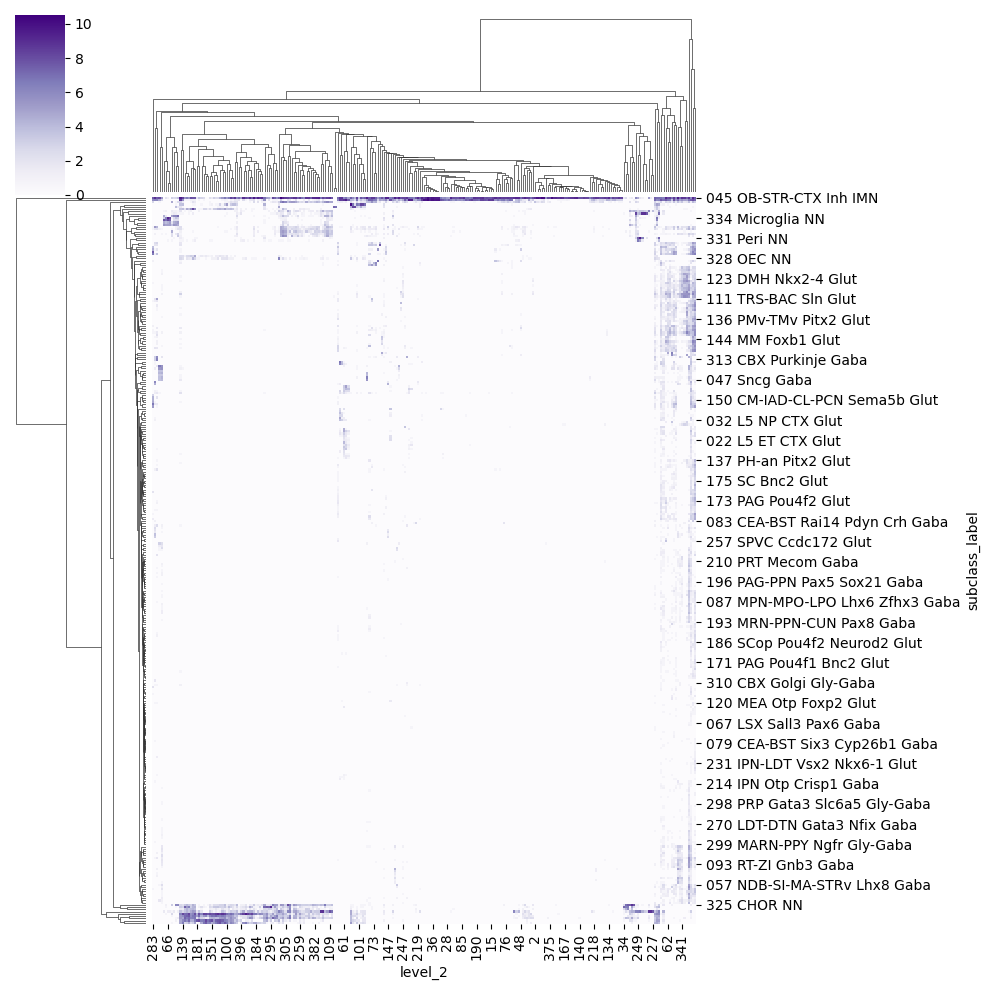

In [22]:
seaborn.clustermap(np.log(adata.obs.groupby('subclass_label')[leaf_key].value_counts().unstack()+1),cmap='Purples')

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


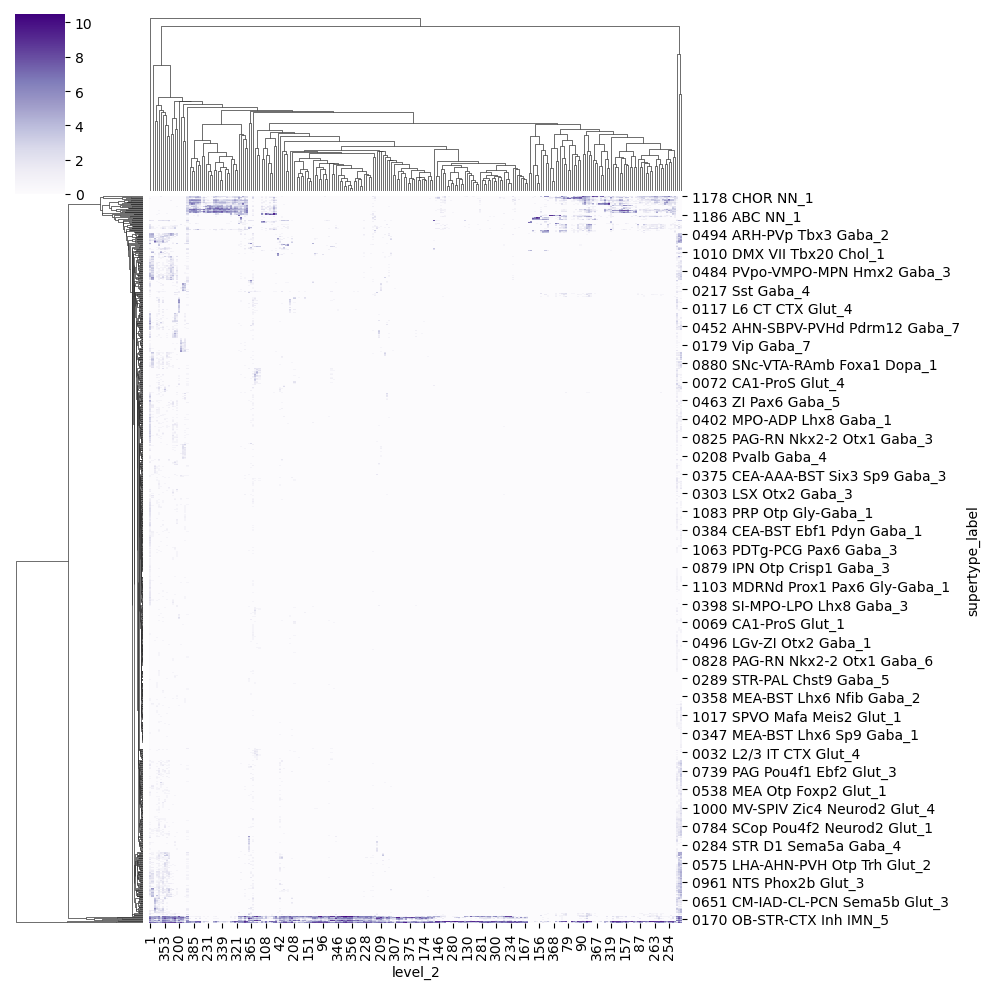

In [23]:
seaborn.clustermap(np.log(adata.obs.groupby('supertype_label')[leaf_key].value_counts().unstack()+1),cmap='Purples')

/scratch/fast/207760/ipykernel_4134648/524432219.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seaborn.clustermap(np.log(adata.obs.groupby('region')['subclass_label'].value_counts().unstack()+1))


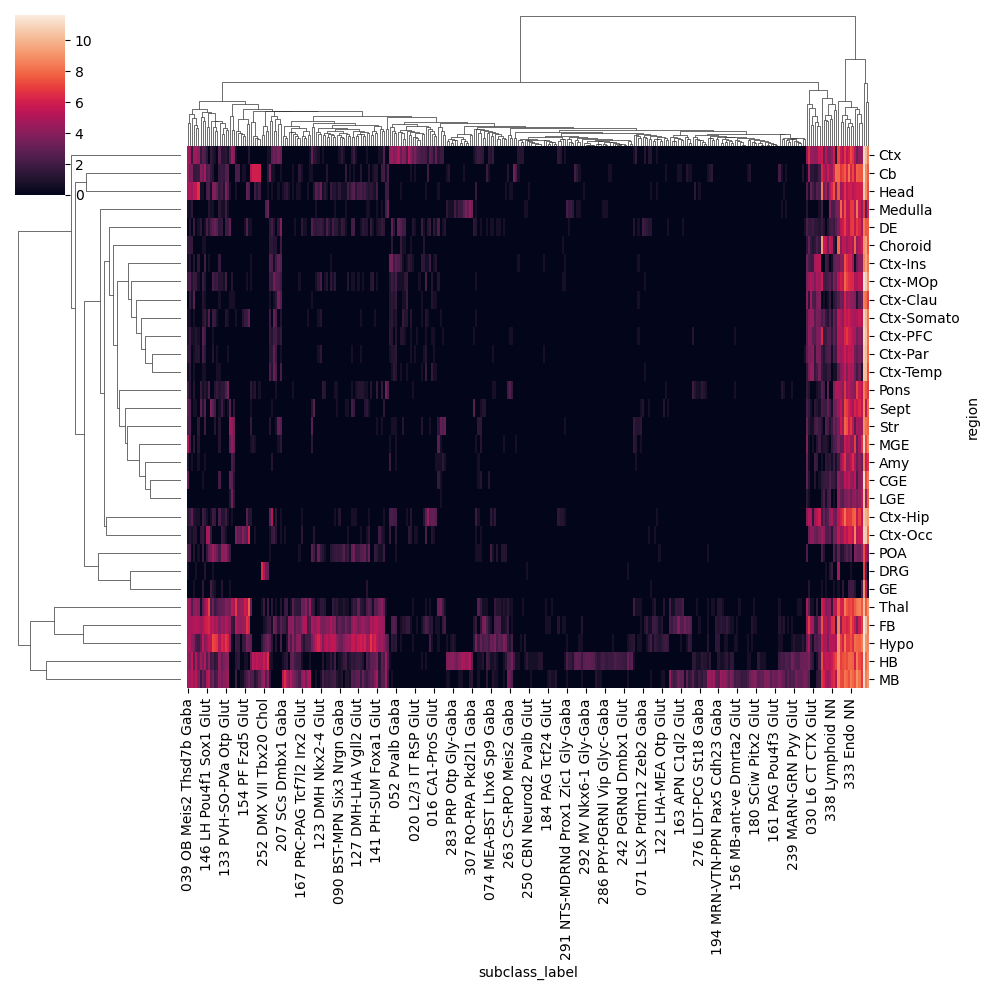

In [24]:
seaborn.clustermap(np.log(adata.obs.groupby('region')['subclass_label'].value_counts().unstack()+1))

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


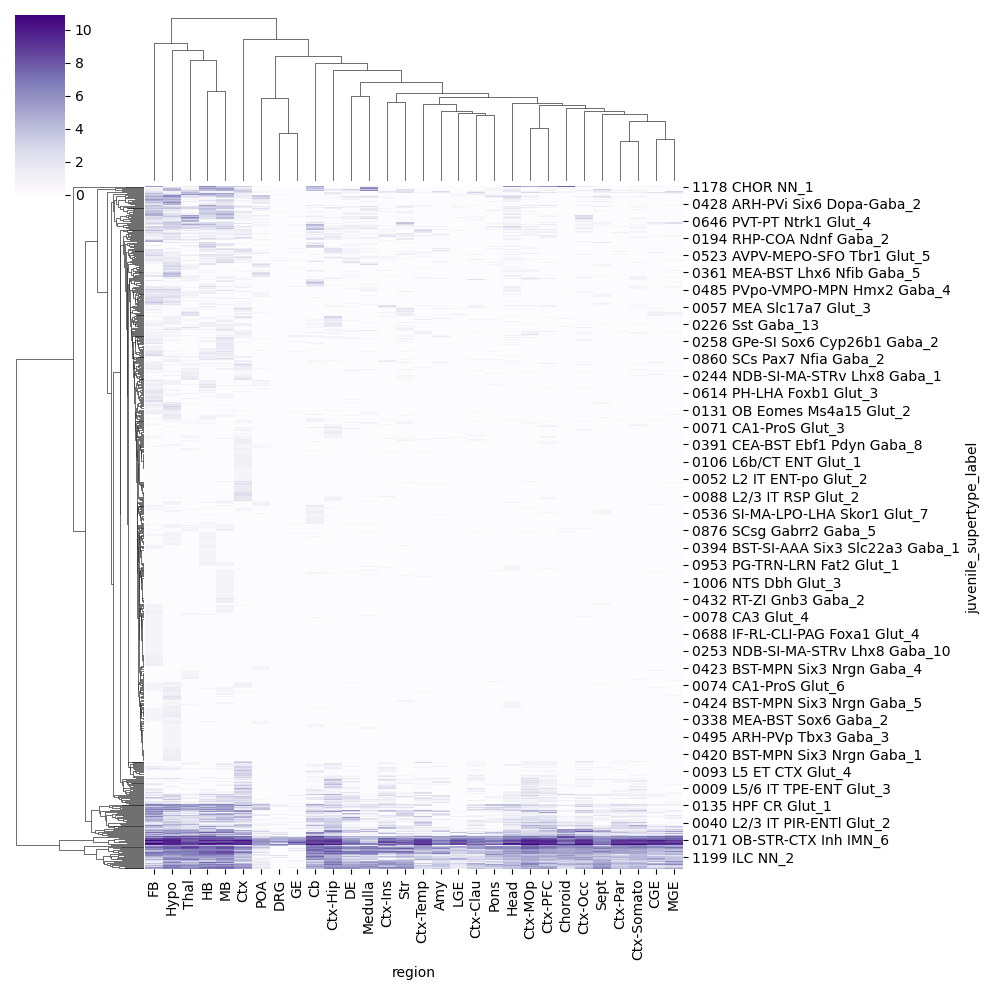

In [25]:
seaborn.clustermap(np.log(adata.obs.groupby('juvenile_supertype_label')['region'].value_counts().unstack()+1),cmap='Purples')

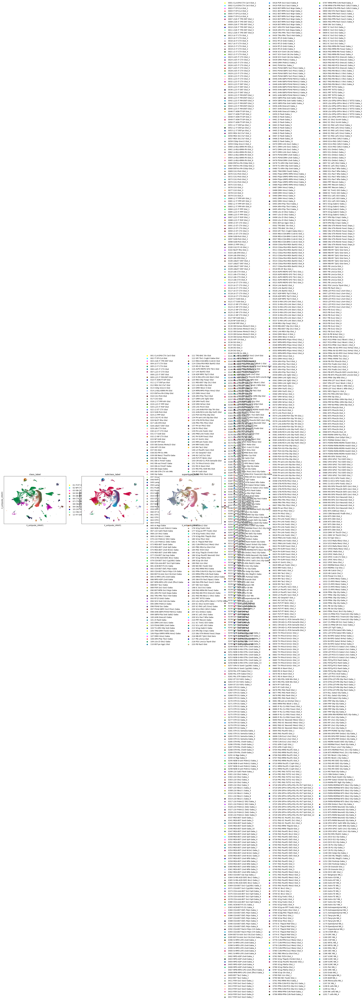

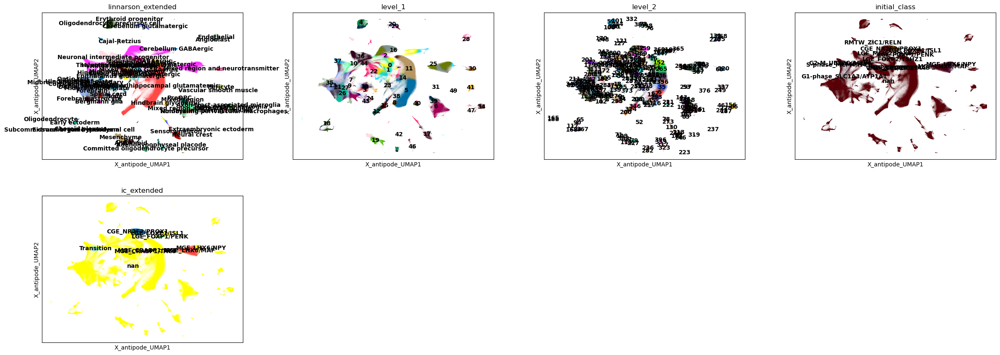

In [26]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["class_label","subclass_label",'supertype_label'],
    palette=sc.pl.palettes.godsnot_102,
)



sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended",'level_1',leaf_key,'initial_class','ic_extended'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)


# Success of TF correlation in juvenile

Used ABC (Yao 2023) subclasses in the dataset or with ABC mapped onto mouse juvenile (Linnarson)

In [27]:
log_real_means,real_mean_levels=antipode.model_functions.get_real_leaf_means(adata,discov_key,leaf_key,layer=layer_key)
real_means=pd.DataFrame(log_real_means.mean(0),columns=adata.var.index,index=real_mean_levels[leaf_key])
real_means=real_means.loc[real_mean_levels[leaf_key],:]

100%|██████████| 259/259 [01:45<00:00,  2.46it/s]


In [28]:
abc_subclass_means=pd.read_csv('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/mouse_wb/AIT21.all.freeze.230815_subclassmeans.csv',index_col=0)

In [29]:
dev_mouse_means=pd.DataFrame(log_real_means[2],columns=adata.var.index,index=real_mean_levels[leaf_key])
dev_mouse_means=dev_mouse_means.loc[:,dev_mouse_means.columns.isin(abc_subclass_means.columns)]
dev_mouse_means = np.exp(dev_mouse_means-dev_mouse_means.max(0)) #scaled linear-space pseudobulk

In [30]:
abc_subclass_means=abc_subclass_means.loc[:,abc_subclass_means.columns.isin(dev_mouse_means.columns)]
abc_subclass_means=abc_subclass_means.loc[:,sorted(abc_subclass_means.columns)]

In [31]:
abc_subclass_means = np.exp(abc_subclass_means-abc_subclass_means.max(0)) #scaled linear-space pseudobulk

In [32]:
#Remove the OB granule cells because their immaturity is a magnet for all dev cells
abc_subclass_means=abc_subclass_means.loc[~abc_subclass_means.index.str.contains('OB-STR'),:]

In [33]:
# gl_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/gene_lists/'
# tf_genes=pd.read_csv(os.path.join(gl_path,'TFs_lambert_pmid29425488_1.01.txt'),sep='\t')
# include_genes=tf_genes['hgnc_symbol']

In [34]:
tf_genes=pd.read_csv('/home/matthew.schmitz/Matthew/utils/zizhens_tf_code.txt',sep='\t')
include_genes=tf_genes['gene'].str.upper()

In [35]:
corrs=sc_analysis.corr2_coeff(dev_mouse_means.loc[:,dev_mouse_means.columns.isin(include_genes)],abc_subclass_means.loc[:,abc_subclass_means.columns.isin(include_genes)])

corrs=np.nan_to_num(corrs,0.)
corrs=pd.DataFrame(corrs,index=dev_mouse_means.index,columns=abc_subclass_means.index)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


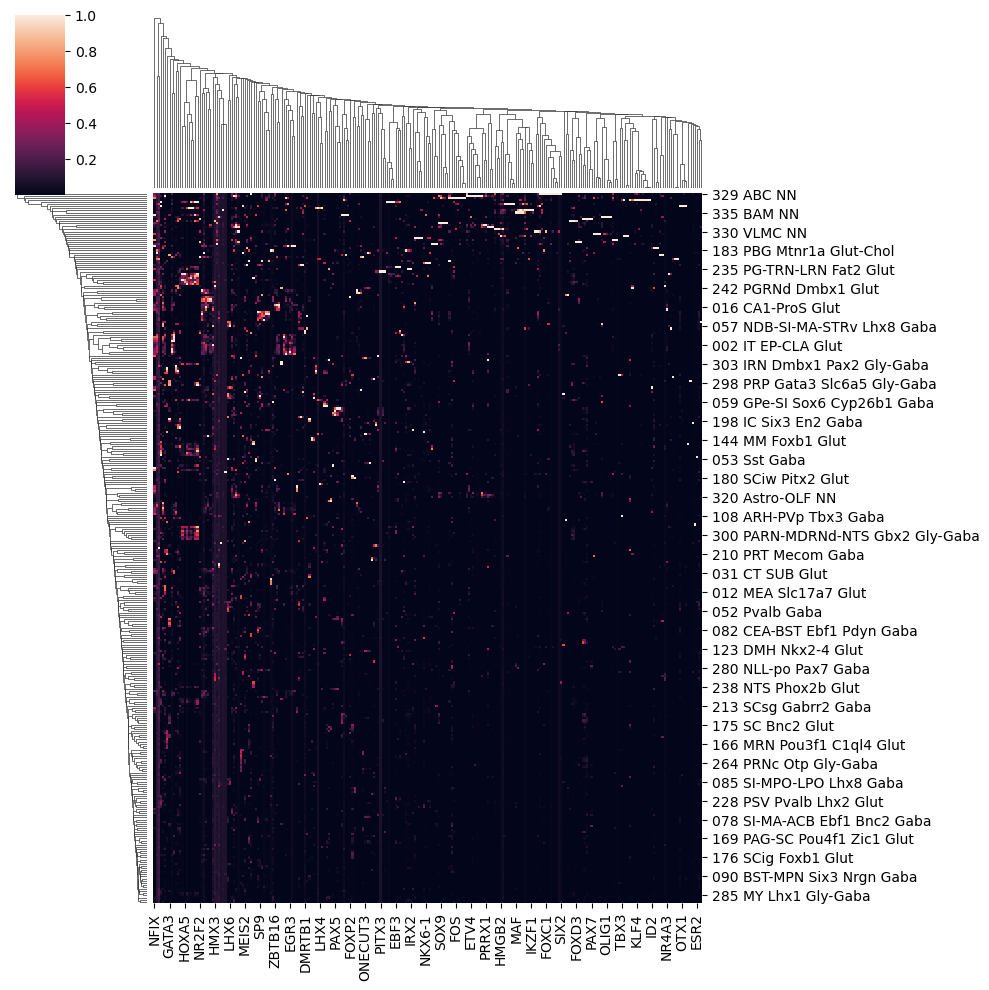

In [36]:
seaborn.clustermap(abc_subclass_means.loc[:,abc_subclass_means.columns.isin(include_genes)],col_cluster=True)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


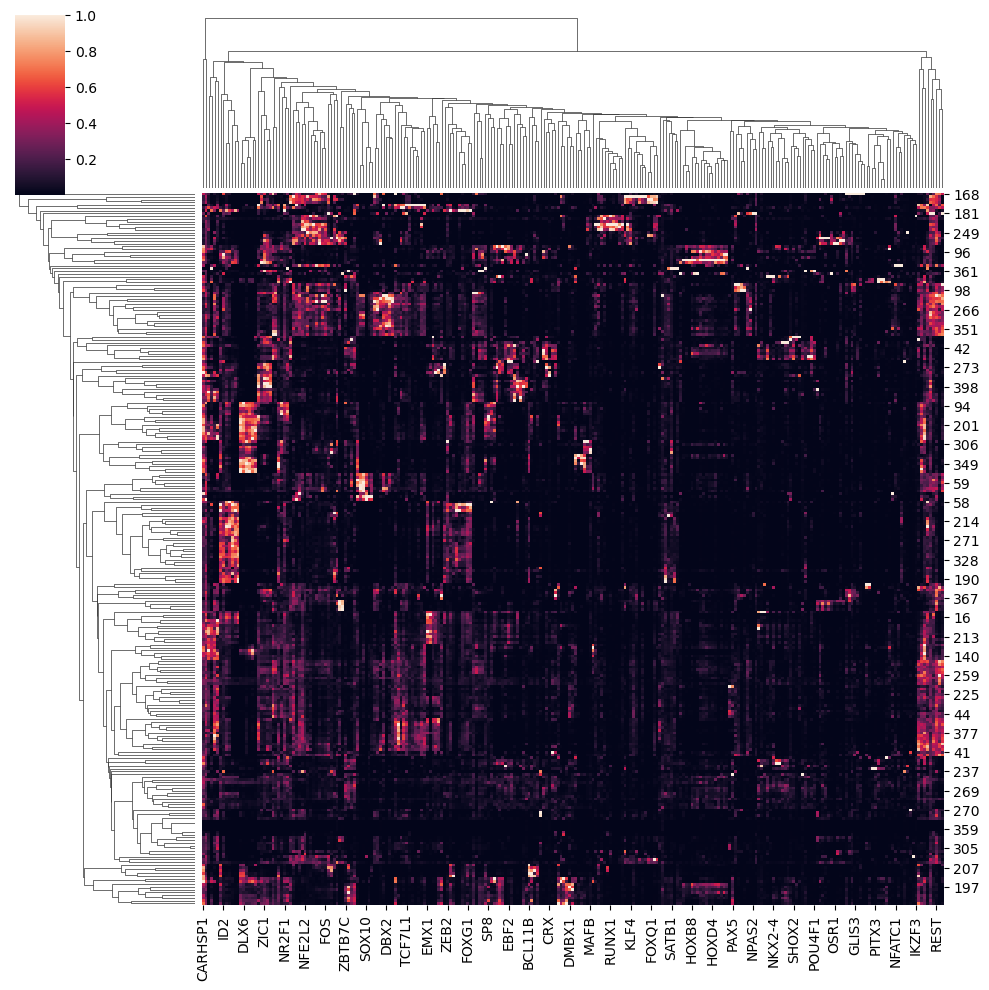

In [37]:
seaborn.clustermap(dev_mouse_means.loc[:,dev_mouse_means.columns.isin(include_genes)],col_cluster=True)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


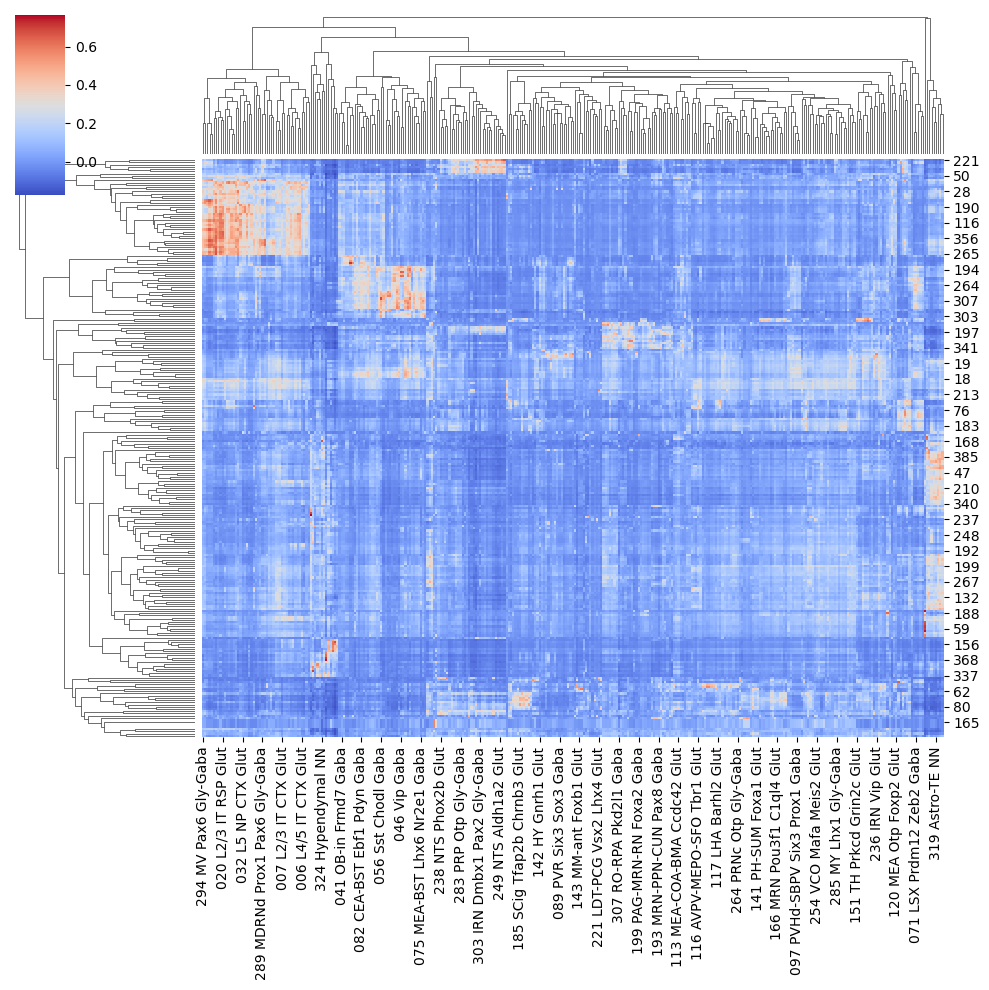

In [38]:
seaborn.clustermap(corrs,cmap='coolwarm')
plt.savefig(os.path.join(sc.settings.figdir,'dev_mouse_adult_mouse_corrs.svg'))

In [39]:
marker_corr_dict=corrs.idxmax(1).to_dict()

In [40]:
adata.obs['abc_subclass_markercor']=adata.obs[leaf_key].replace(marker_corr_dict)

/scratch/fast/207760/ipykernel_4134648/966325606.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['abc_subclass_markercor']=adata.obs[leaf_key].replace(marker_corr_dict)


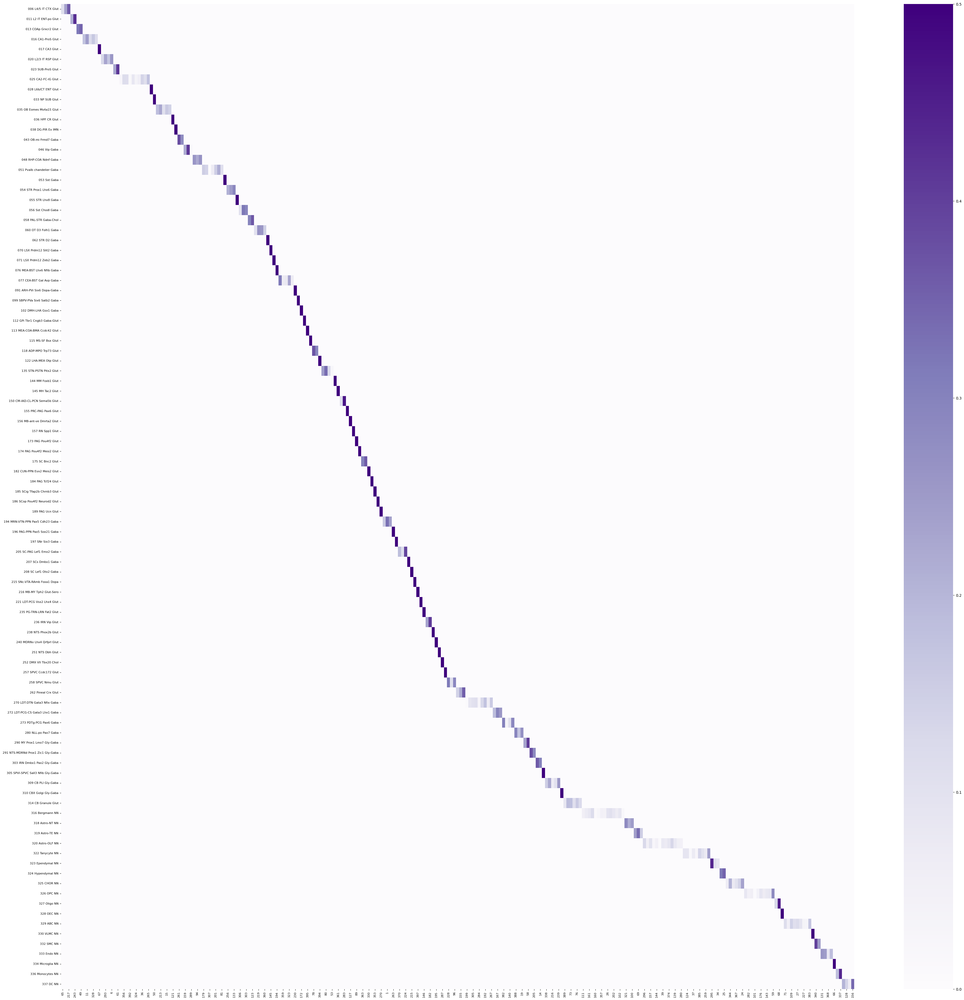

In [41]:
adata.obs['abc_subclass_markercor'] = adata.obs['abc_subclass_markercor'].cat.reorder_categories(sorted(adata.obs['abc_subclass_markercor'].cat.categories))
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'abc_subclass_markercor',leaf_key),cmap='Purples')
plt.savefig(os.path.join(sc.settings.figdir,'dev_abc_jaccards.svg'))

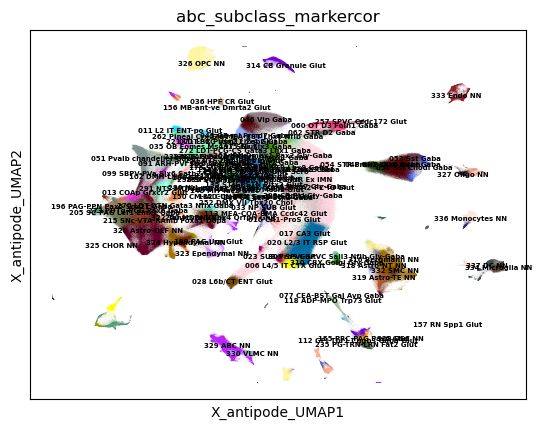

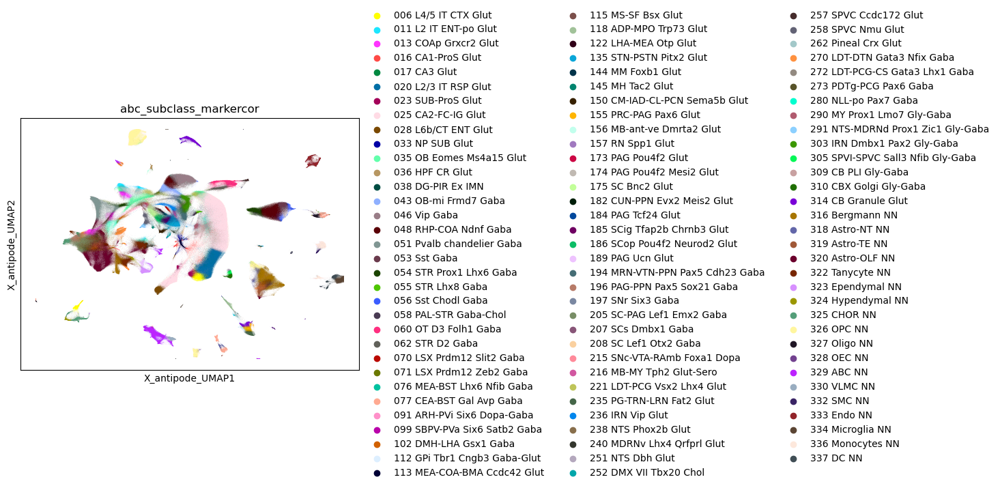

In [42]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["abc_subclass_markercor"],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',legend_fontsize=5
    
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["abc_subclass_markercor"],
    palette=sc.pl.palettes.godsnot_102
)

# ABC -> Juvenile Mouse -> Development Mouse

In [43]:
juvdata=sc.read_h5ad(os.path.expanduser('/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/extra/KDCbVelocityMouseWbAdultPresupervisionHumanOrthos.h5ad'))

In [44]:
# juv_aggr_means=antipode.model_functions.group_aggr_anndata(juvdata,['subclass_label'])

juv_aggr_means=antipode.model_functions.group_aggr_anndata(juvdata,['subclass_label'],layer='spliced',normalize=True)
juv_aggr_sums=antipode.model_functions.group_aggr_anndata(juvdata,['subclass_label'],layer='spliced',normalize=False,agg_func=np.sum)
juv_log_real_means=antipode.model_functions.safe_log_transform(juv_aggr_means[0],juv_aggr_sums[0].sum(-1)[...,np.newaxis])

100%|██████████| 327/327 [00:33<00:00,  9.83it/s]


In [45]:
juv_mouse_means=pd.DataFrame(juv_log_real_means,columns=juvdata.var.index,index=juv_aggr_means[1]['subclass_label'])
dev_mouse_means=pd.DataFrame(log_real_means[2],columns=adata.var.index,index=real_mean_levels[leaf_key])
dev_mouse_means=dev_mouse_means.loc[:,dev_mouse_means.columns.isin(abc_subclass_means.columns)]

In [46]:
juv_mouse_means = np.exp(juv_mouse_means-juv_mouse_means.max(0)) #scaled linear-space pseudobulk
dev_mouse_means = np.exp(dev_mouse_means-dev_mouse_means.max(0)) #scaled linear-space pseudobulk

In [47]:
juv_mouse_means=juv_mouse_means.loc[:,juv_mouse_means.columns.isin(dev_mouse_means.columns)]
dev_mouse_means=dev_mouse_means.loc[:,dev_mouse_means.columns.isin(juv_mouse_means.columns)]
juv_mouse_means=juv_mouse_means.loc[:,dev_mouse_means.columns]

In [48]:
tf_genes=pd.read_csv('/home/matthew.schmitz/Matthew/utils/zizhens_tf_code.txt',sep='\t')
include_genes=tf_genes['gene'].str.upper()

In [49]:
corrs=sc_analysis.corr2_coeff(dev_mouse_means.loc[:,dev_mouse_means.columns.isin(include_genes)],juv_mouse_means.loc[:,juv_mouse_means.columns.isin(include_genes)])
corrs=np.nan_to_num(corrs,0.)
corrs=pd.DataFrame(corrs,index=dev_mouse_means.index,columns=juv_mouse_means.index)

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


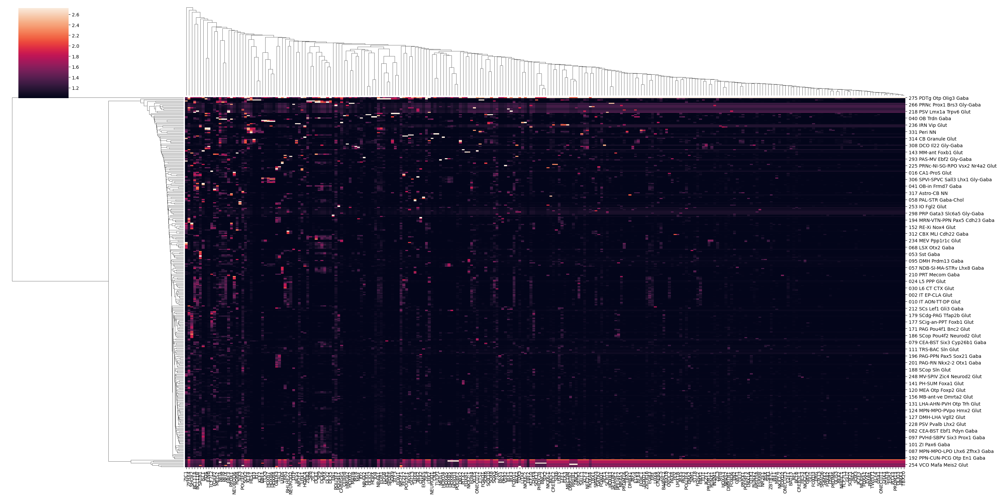

In [50]:
seaborn.clustermap(np.exp(juv_mouse_means.loc[:,juv_mouse_means.columns.isin(include_genes)]),col_cluster=True,xticklabels=True, figsize=(30,15))

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


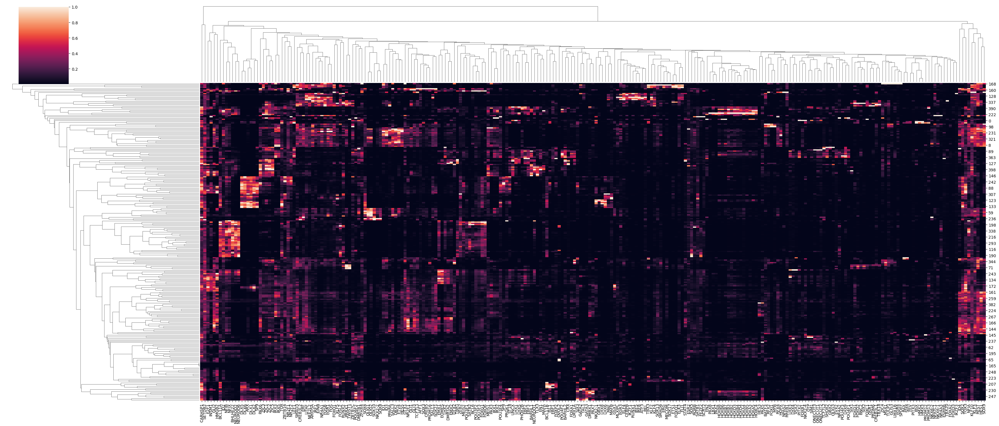

In [51]:
# plt.figure(figsize=(25,15))
seaborn.clustermap(dev_mouse_means.loc[:,dev_mouse_means.columns.isin(include_genes)],col_cluster=True,xticklabels=True, figsize=(35,15))
plt.savefig(os.path.join(sc.settings.figdir,'mouse_tf_heatmap.svg'))

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


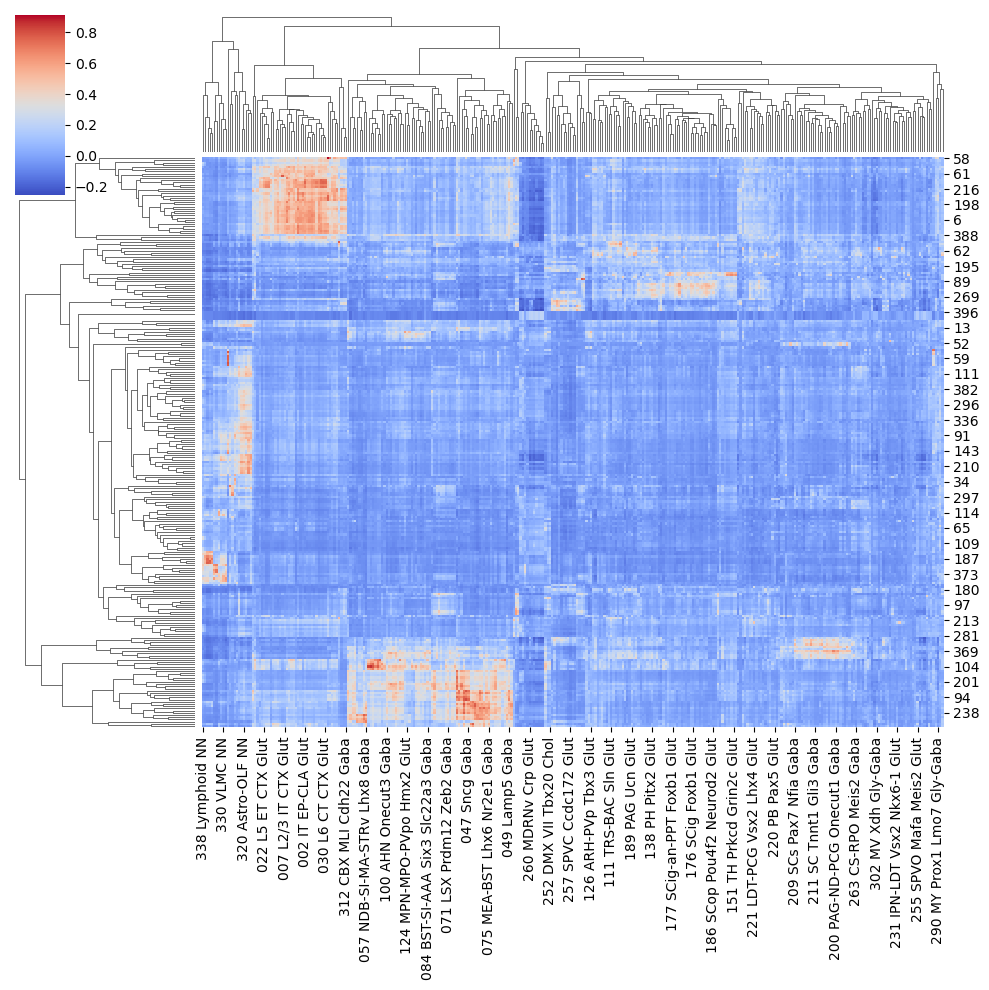

In [52]:
seaborn.clustermap(corrs,cmap='coolwarm')
plt.savefig(os.path.join(sc.settings.figdir,'dev_mouse_juv_mouse_corrs.svg'))

In [53]:
marker_corr_dict=corrs.idxmax(1).to_dict()

In [54]:
adata.obs['juv_subclass_markercor']=adata.obs[leaf_key].replace(marker_corr_dict)

/scratch/fast/207760/ipykernel_4134648/799641201.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['juv_subclass_markercor']=adata.obs[leaf_key].replace(marker_corr_dict)


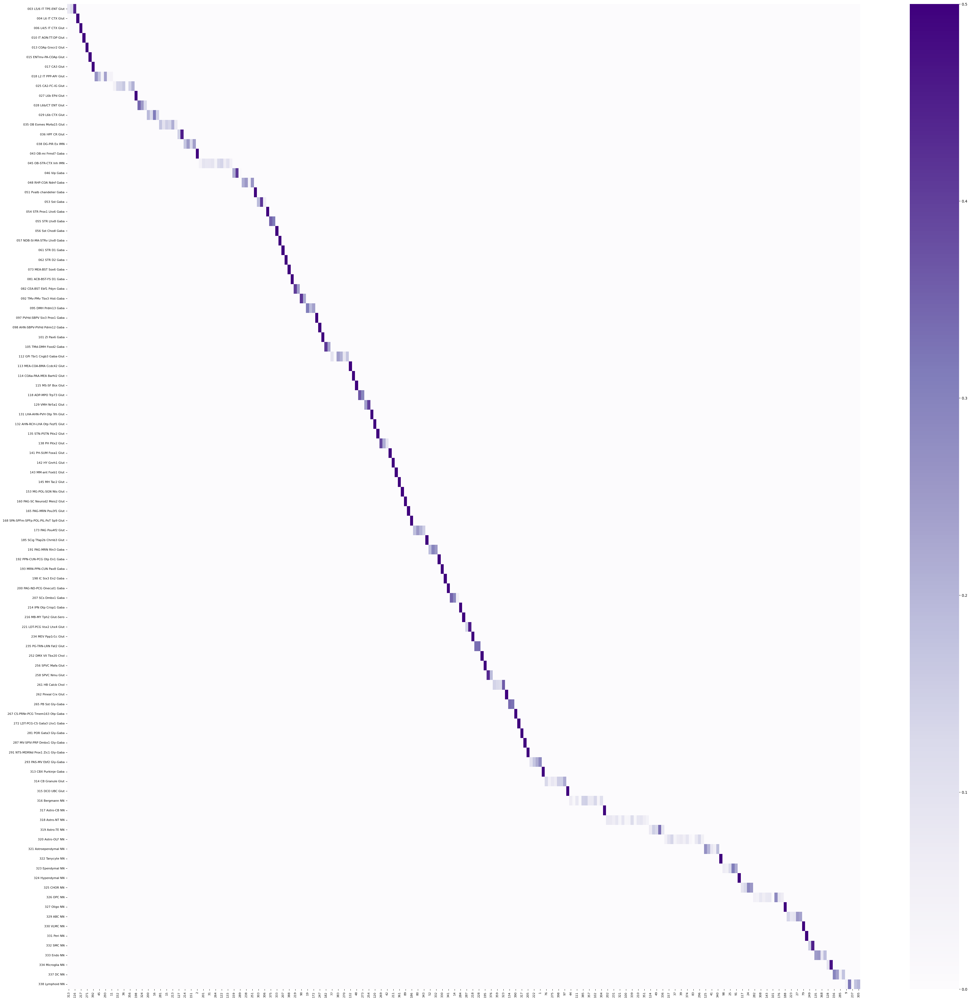

In [55]:
adata.obs['juv_subclass_markercor'] = adata.obs['juv_subclass_markercor'].cat.reorder_categories(sorted(adata.obs['juv_subclass_markercor'].cat.categories))
sc_analysis.create_heatmap(sc_analysis.get_cross_category_jaccard(adata.obs,'juv_subclass_markercor',leaf_key),cmap='Purples')


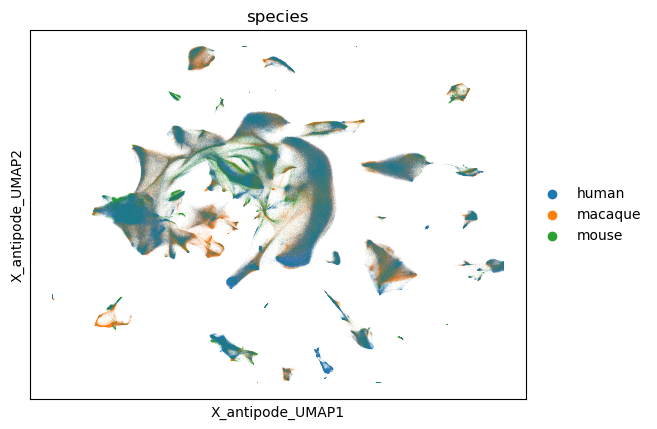

In [56]:
# adata.uns['species_colors']=[adata.uns['species_color_dict'][x] for x in adata.obs[discov_key].cat.categories]
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["species"],
)

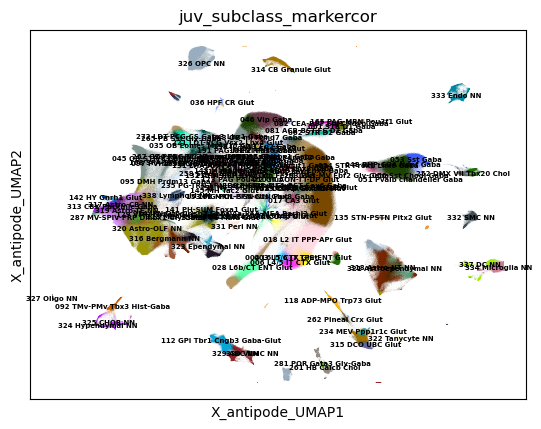

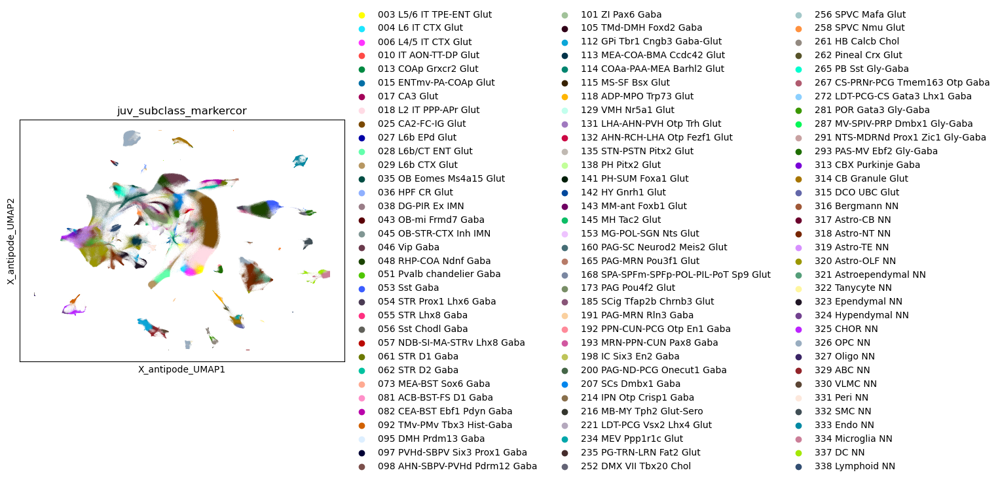

In [57]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["juv_subclass_markercor"],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',legend_fontsize=5
    
)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["juv_subclass_markercor"],
    palette=sc.pl.palettes.godsnot_102
)

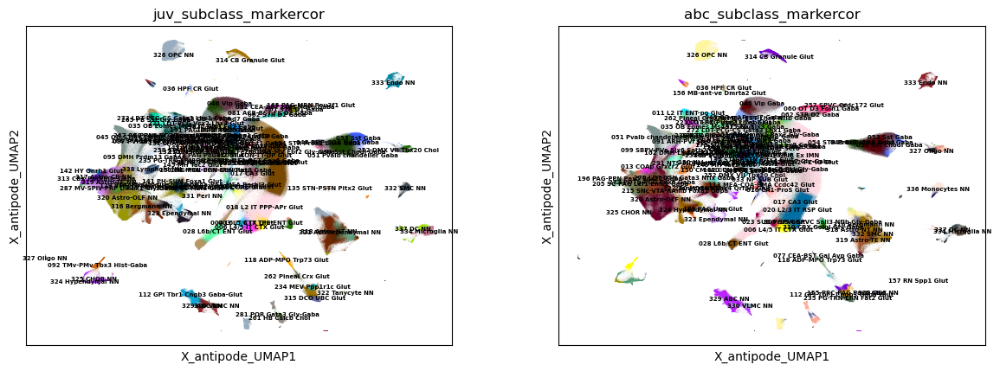

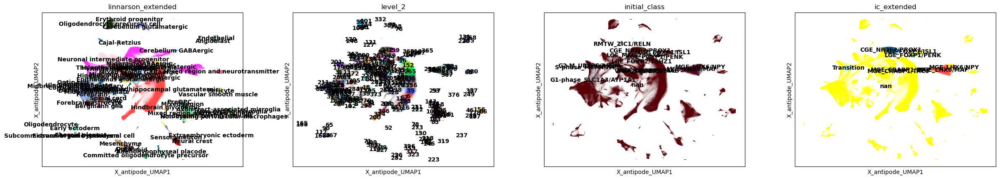

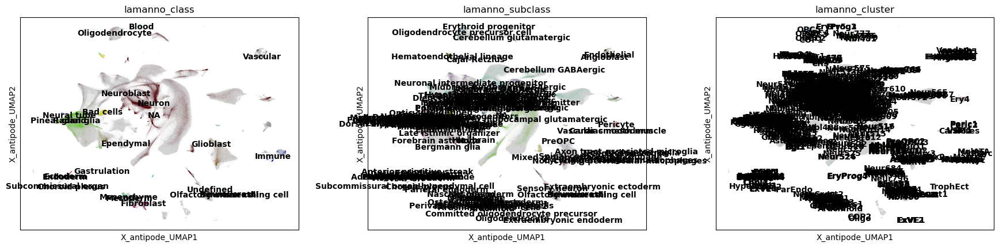

In [58]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["juv_subclass_markercor",'abc_subclass_markercor'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',legend_fontsize=5
    
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["linnarson_extended",leaf_key,'initial_class','ic_extended'],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=["lamanno_class","lamanno_subclass","lamanno_cluster"],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data'
)



In [59]:
# adata.obs.loc[:,[leaf_key,'initial_class','ic_extended','abc_subclass_markercor','juv_subclass_markercor',"linnarson_extended","lamanno_class","lamanno_subclass","lamanno_cluster","female","neighborhood","curated_class_label"]].astype(str).to_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/many_mappings2.txt.gz',compression='gzip')